# Duckietown World tutorial

The package `duckietown_world` implements the map representation for the 
Duckeietown World.

In [24]:
# disabling contracts for speed
import contracts
contracts.disable_all()

In [25]:
import duckietown_world as dw

In [26]:
# reducing the verbosity to critical
dw.logger.setLevel(50)


## Listing available maps

Function `list_maps` returns the list of maps:

In [27]:
dw.list_maps()

['loop_obstacles',
 'udem1',
 'robotarium2',
 '4way',
 'small_loop_cw',
 'robotarium1',
 'ethz_amod_lab_k31',
 'loop_empty',
 'regress_4way_drivable',
 'ETHZ_autolab_technical_track',
 'small_loop',
 'straight_road',
 'zigzag_dists',
 'ETHZ_autolab_fast_track',
 'loop_dyn_duckiebots',
 'loop_pedestrians',
 'straight_road_down',
 'regress_4way_adam']

## Loading a map

Use `load_map` to load a map:

In [28]:
m = dw.load_map('4way')
print(m)

DuckietownMap(children={'ob00-trafficlight': TrafficLight(children={}, spatial_relations={}), 'tilemap': TileMap(children={'tile-0-4': Tile(children={'curve_left': PlacedObject(children={'curve': PlacedObject(children={'lane1': LaneSegment(children={}, spatial_relations={}), 'lane2': LaneSegment(children={}, spatial_relations={})}, spatial_relations={'lane1': GroundTruth(() -> ('lane1',)  SE2Transform([0.0, 0.0],0.0)), 'lane2': GroundTruth(() -> ('lane2',)  SE2Transform([0.0, 0.0],1.5707963267948966))})}, spatial_relations={'curve': GroundTruth(() -> ('curve',)  SE2Transform([0.0, 0.0],4.71238898038469))})}, spatial_relations={1: GroundTruth(() -> ('curve_left',)  SE2Transform([0.0, 0.0],0.0))}), 'tile-1-4': Tile(children={'straight': PlacedObject(children={'lane1': LaneSegment(children={}, spatial_relations={}), 'lane2': LaneSegment(children={}, spatial_relations={})}, spatial_relations={'lane1': GroundTruth(() -> ('lane1',)  SE2Transform([0.0, 0.0],0.0)), 'lane2': GroundTruth(() -> (

Later, we will see what is inside a map.

## Drawing a map

We define this utility function to draw the map: 

In [29]:
from duckietown_world.svg_drawing.ipython_utils import ipython_draw_svg

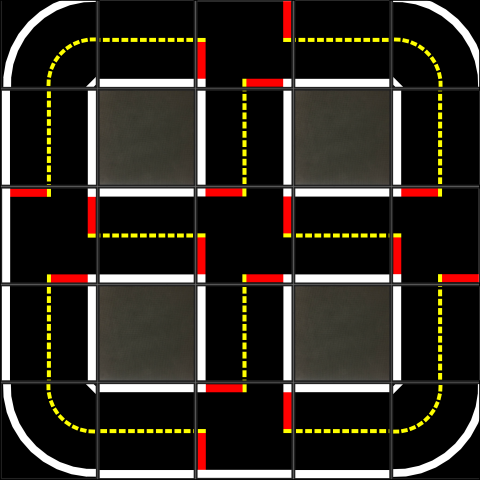

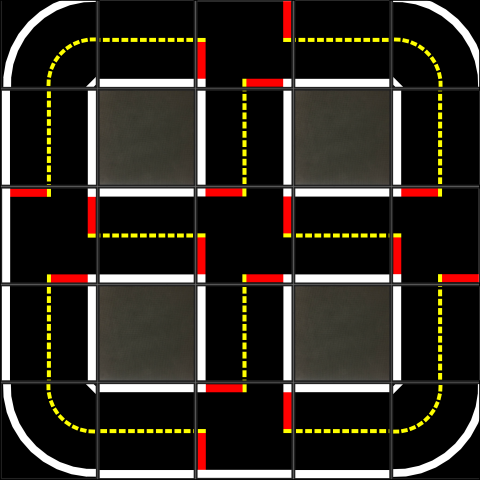

In [30]:
ipython_draw_svg(m)

## Display all the maps available


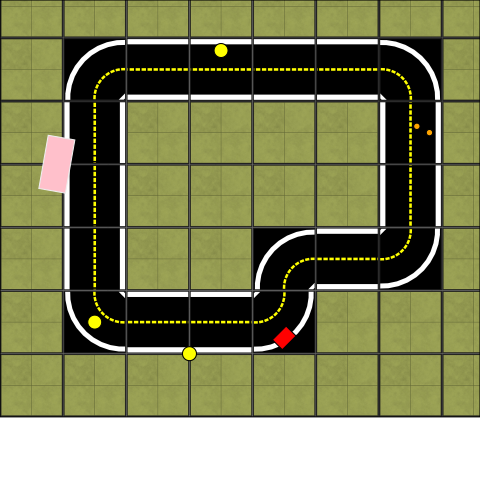

loop_obstacles


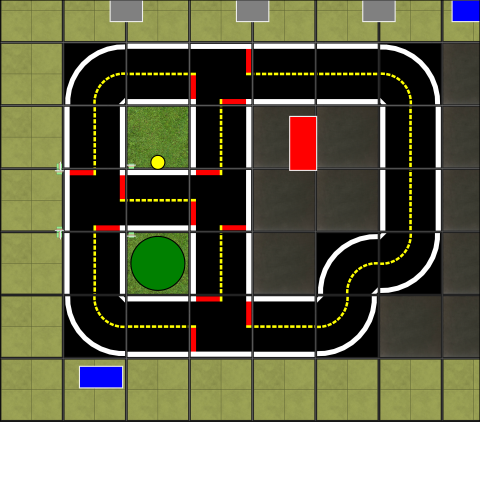

udem1


robotarium2


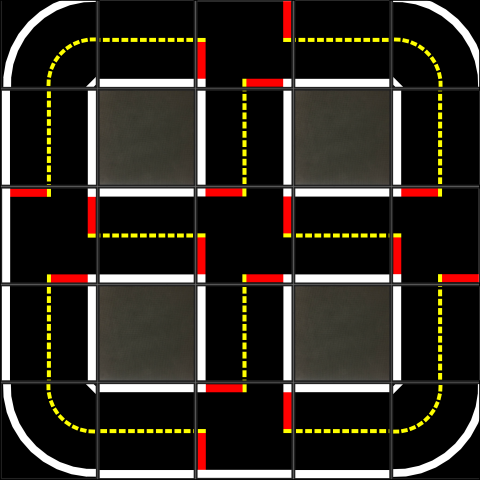

4way


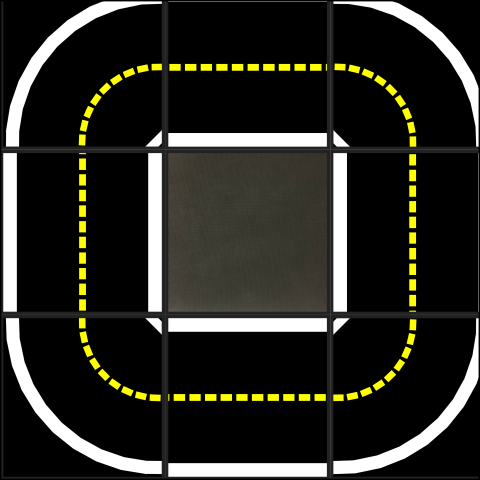

small_loop_cw


robotarium1


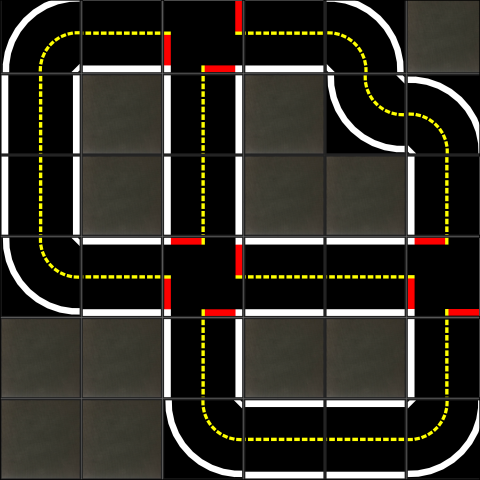

ethz_amod_lab_k31


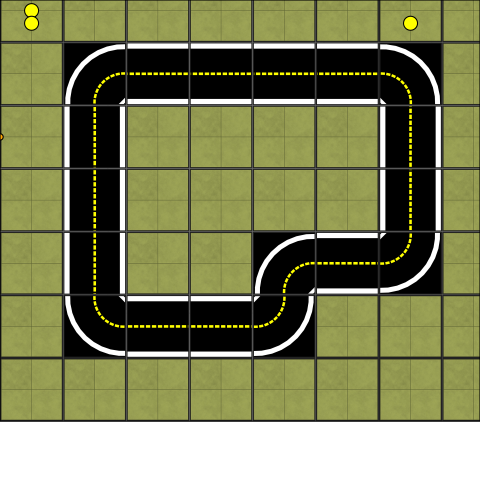

loop_empty


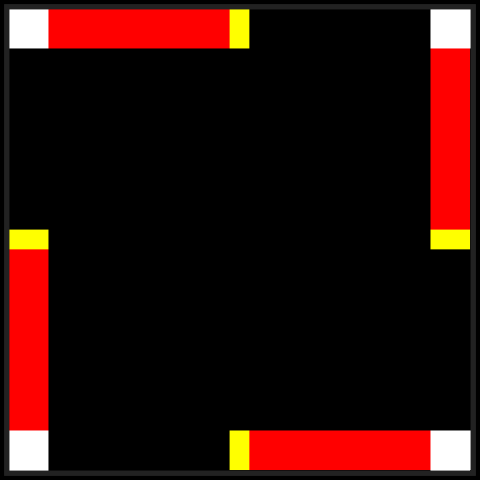

regress_4way_drivable


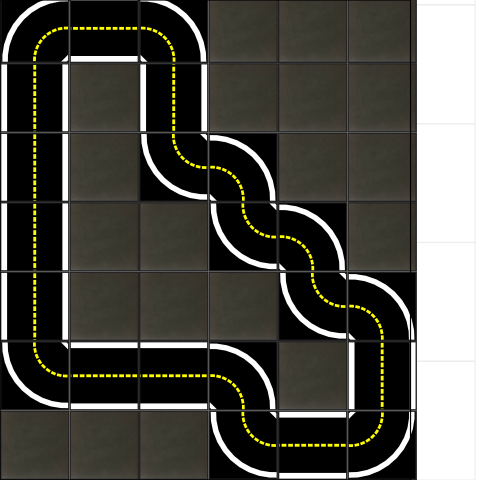

ETHZ_autolab_technical_track


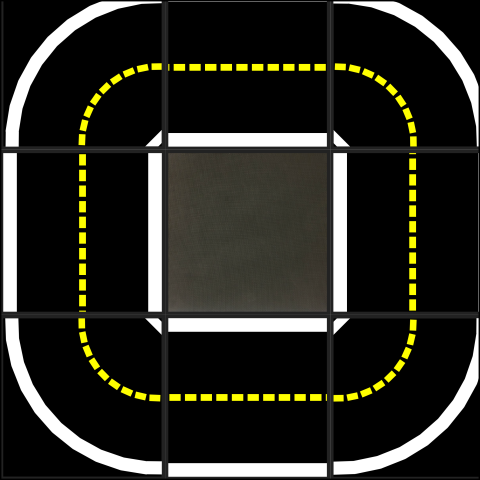

small_loop


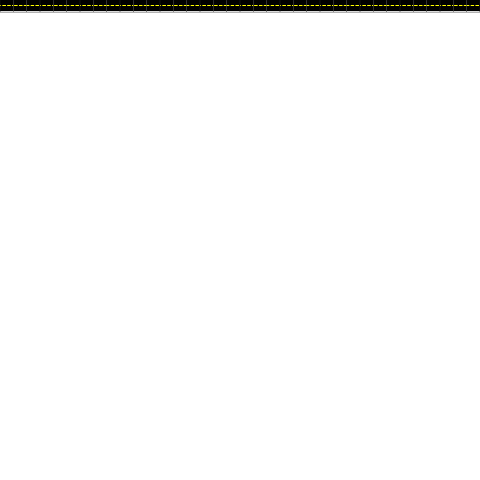

straight_road


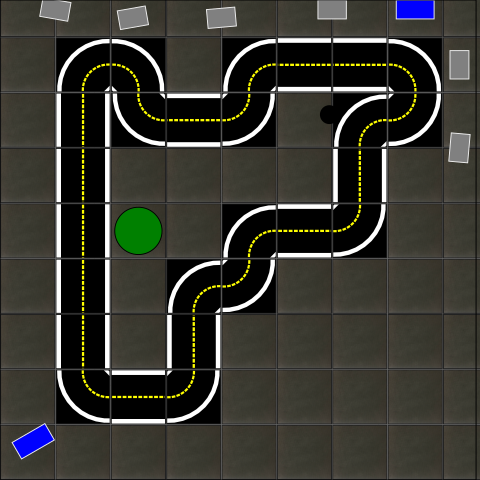

zigzag_dists


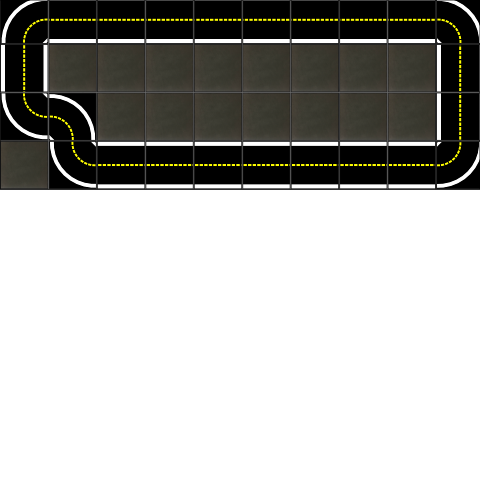

ETHZ_autolab_fast_track


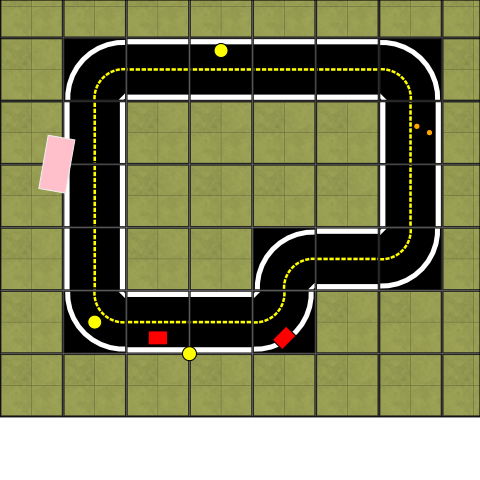

loop_dyn_duckiebots


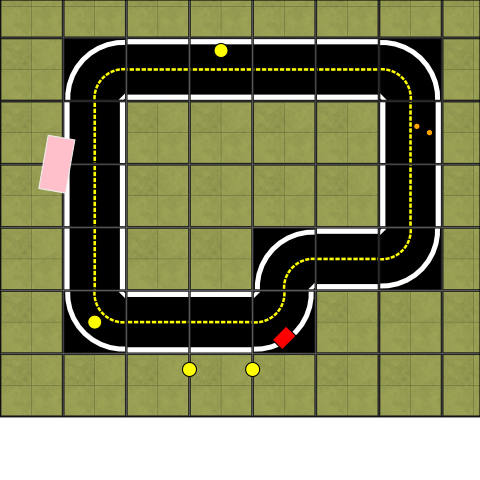

loop_pedestrians


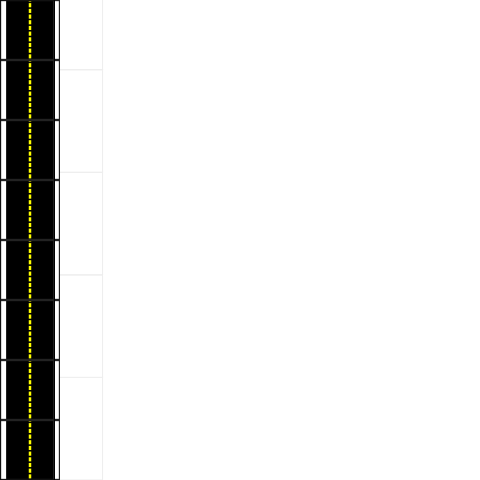

straight_road_down


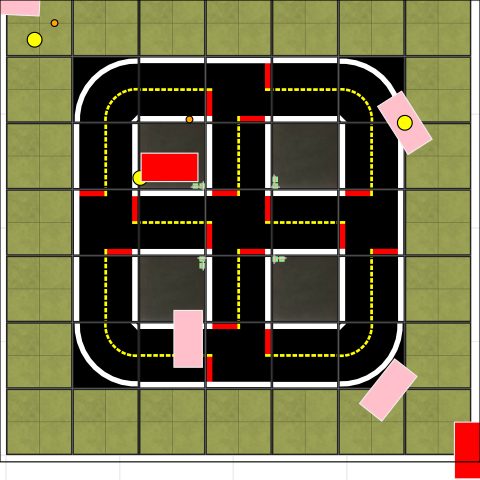

regress_4way_adam


In [33]:
for map_name in dw.list_maps():
    m1 = dw.load_map(map_name)
    image = ipython_draw_svg(m1, 'out/' + map_name)
    print(map_name)

## Creating new maps

Look for the '*.yaml' files in `duckietown_world` to get examples of data format.

You can also define a new map "inline":

In [32]:
map_data_yaml = """

# 6x6 map for the AMODLab in K31; three loops, with three intersetions (2 three-way, 1 four-way)
- [curve_left/W, straight/W, 3way_left/W, straight/W, curve_left/N, asphalt]
- [straight/S  , aspha lt   ,  straight/S, asphalt   , curve_left/S, curve_left/N]
- [straight/S  , asphalt   ,  straight/S, asphalt   , asphalt     , straight/S]
- [curve_right/W, straight/W, 4way/W     , straight/W, straight/W  , 3way_left/N]
- [asphalt     , asphalt   ,  straight/S, asphalt   , asphalt     , straight/S]
- [asphalt     , asphalt   ,curve_right/W, straight/W, straight/W  , curve_right/S]

tile_size: 0.585
"""

import yaml

map_data = yaml.load(map_data_yaml)

m = dw.construct_map(map_data)

ipython_draw_svg(m);

/home/duckietown/duckietown-world/src/duckietown_world/duckietown-world-venv/lib/python3.6/site-packages/ipykernel_launcher.py:16: YAMLLoadWarning:

calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.



ParserError: while parsing a block collection
  in "<unicode string>", line 4, column 1:
    - [curve_left/W, straight/W, 3wa ... 
    ^
expected <block end>, but found '?'
  in "<unicode string>", line 11, column 1:
    tile_size: 0.585
    ^

## Available tiles

In [16]:
map_data_yaml = """

# 3x3 tiles with left turns at the corners going in a counter-clockwise loop
tiles:
- [straight/N, straight/W, straight/S, straight/E]
- [curve_left/N, curve_left/W, curve_left/S, curve_left/E]
- [curve_right/N, curve_right/W, curve_right/S, curve_right/E]
- [4way/N, 4way/W, 4way/S, 4way/E]
- [3way_left/N, 3way_left/W, 3way_left/S, 3way_left/E]
- [3way_right/N, 3way_right/W, 3way_right/S, 3way_right/E]


"""

import yaml

map_data = yaml.load(map_data_yaml)

m = dw.construct_map(map_data, tile_size=0.61)

ipython_draw_svg(m);

/home/duckietown/duckietown-world/src/duckietown_world/duckietown-world-venv/lib/python3.6/site-packages/ipykernel_launcher.py:17: YAMLLoadWarning:

calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.



TypeError: construct_map() got an unexpected keyword argument 'tile_size'